In [1]:
# Initialize Otter
import otter
grader = otter.Notebook("csc475-575-Spring2022-assignment6.ipynb")

# CSC475/575 Spring 2022 - Assignment 

This assignment covers topics related to sound source separation and transcription. Information about the course can be found at the 
[CSC475/575 Brightspace](https://bright.uvic.ca/d2l/home/196001). 


* A6.1: Listening to results of sound source separation using Spleeter 
* A6.2: Pitch shift vocals and remix    
* A6.3: Sonify pitch of vocals 
* A6.4: Create simple drum track from drum stem 
* A6.5: Simple music transcription of melody 

CSC575 only (instead of A4.1): 
* A6.G: Experimental investigation of the use of sound source separation for genre classification  

Each question is worth 2 points for a total of 10 points for the assignment. 


In [2]:
import numpy as np
import random
import IPython.display as ipd
import matplotlib.pyplot as plt
import math 
%matplotlib inline
import otter
grader = otter.Notebook()
import scipy.io.wavfile as wav
from scipy import interpolate
import librosa

#### **Question A6.1 (basic):** 
 
 
In this question you will be using a state-of-the art deep learning sound source separation library: https://github.com/deezer/spleeter to explore sound source separation, and transcription. 
Use the recording: `pop.00015.wav` for the questions in this assignment. 
 
Run the sound source separation with the 4 stem model on this example audio track. Listen and plot the time-domain waveforms of the 4 individual stems. Comment on what you hear.

 (**Basic: 2 points**)


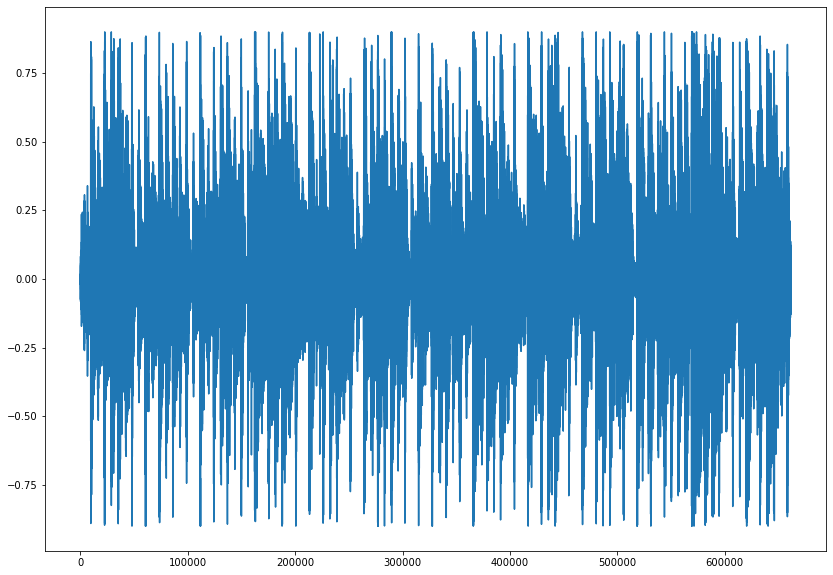

In [7]:
y, sr = librosa.load('pop.00015.wav')
y = y.astype(np.float32) / sr 
y = (0.9 / max(y)) * y
plt.figure(figsize=(14,10)) 
plt.plot(y)
ipd.Audio(y, rate=sr)

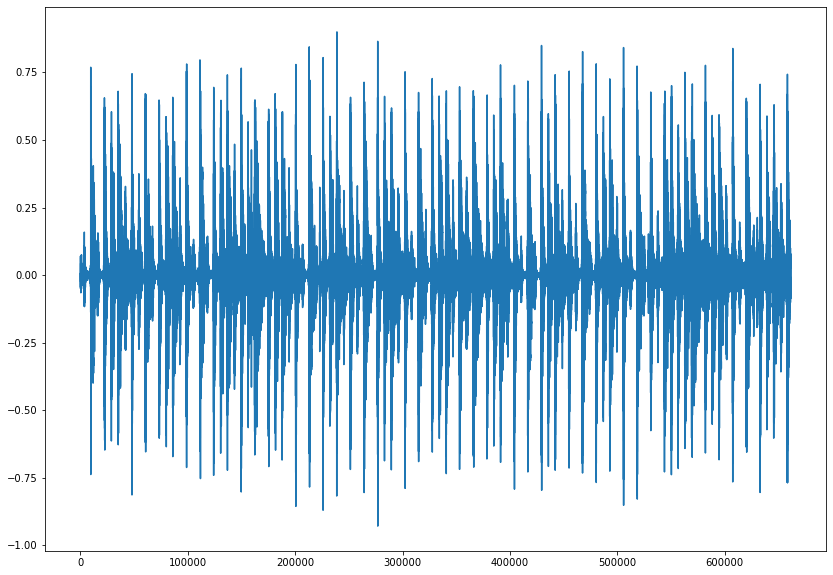

In [8]:
yd, srd = librosa.load('drums.wav')
yd = yd.astype(np.float32) / srd 
yd = (0.9 / max(yd)) * yd
plt.figure(figsize=(14,10)) 
plt.plot(yd)
ipd.Audio(yd, rate=srd)

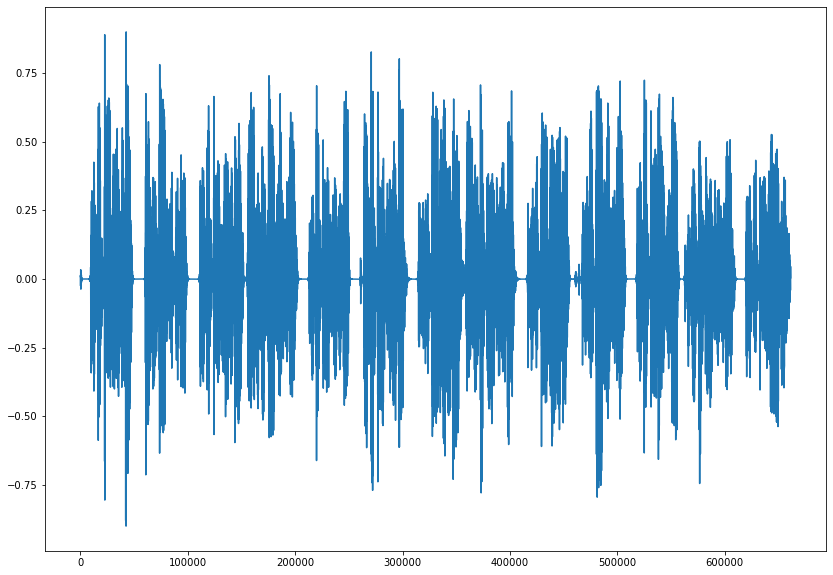

In [12]:
yb, srb = librosa.load('bass.wav')
yb = yb.astype(np.float32) / srb
yb = (0.9 / max(yb)) * yb
plt.figure(figsize=(14,10))  
plt.plot(yb)
ipd.Audio(yb, rate=srb)

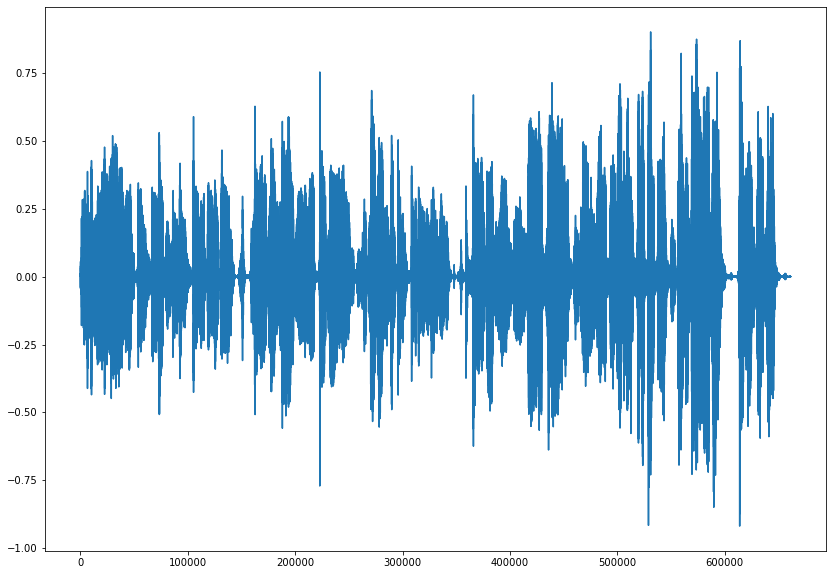

In [13]:
yv, srv = librosa.load('vocals.wav')
yv = yv.astype(np.float32) / srv 
yv = (0.9 / max(yv)) * yv
plt.figure(figsize=(14,10))  
plt.plot(yv)
ipd.Audio(yv, rate=srv)

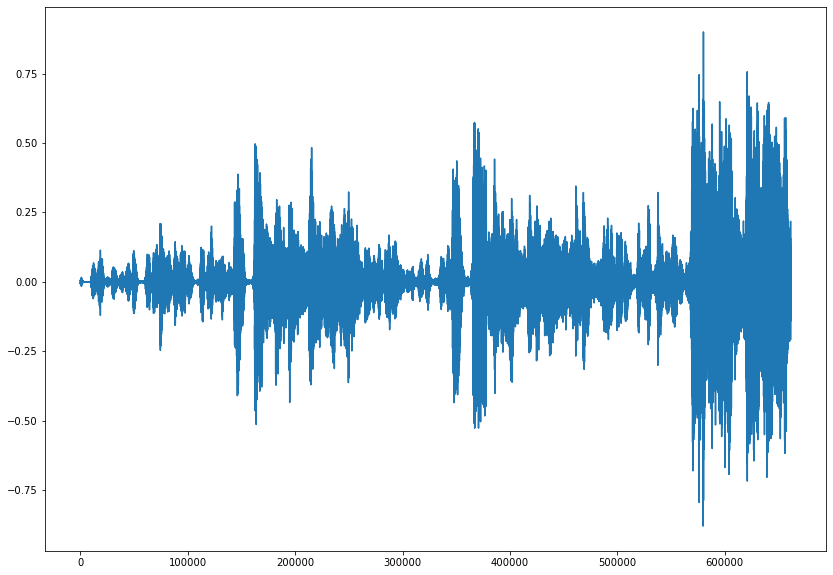

In [14]:
yo, sro = librosa.load('other.wav')
yo = yo.astype(np.float32) / sro 
yo = (0.9 / max(yo)) * yo
plt.figure(figsize=(14,10)) 
plt.plot(yo)
ipd.Audio(yo, rate=sro)

**In case of drums and vocals spleeter seem to have done a good job at seperating those stems. Though in case of vocals there seems to be parts where the audio cuts out or becomes mushy. For base it seems to have captured the low frequency very well. In case of other, it sounds like some sort of guitar or piano/keyboard track**

#### **Question A6.2 (basic):** 

Pitch shift the vocal stem by a major third (4 semitones) using [librosa.effects.pitch_shift](https://librosa.org/doc/latest/generated/librosa.effects.pitch_shift.html) and mix the pitch shifted audio with the other stems. Listen to the result and comment on it. 


(**Basic: 2 points**)


In [18]:
#original vocal track
yv, srv = librosa.load('vocals.wav')
yv_shift = librosa.effects.pitch_shift(yv,sr=srv,n_steps=4)
ipd.Audio(yv, rate=srv)

In [19]:
#pitch shifted audio
ipd.Audio(yv_shift, rate=srv)

In [20]:
#New combined pitch shifted mixed with other stems
y_new = np.column_stack((yd,yb,yv_shift,yo))
wav.write('pitch.shift.pop00015.wav',srv,y_new)
yt, srt = librosa.load('pitch.shift.pop00015.wav')
ipd.Audio(yt, rate=srt)

**After mixing the pitch shifted audio with the other stems, we were able to get a new audio recording where vocalist voice has been pitch shifted while keeping all the other sounds at the same pitch. There still seems to be some issues with this, as you can hear a different pitched chorus at times, indicating that the audio seperation on vocal may not have been perfect;for example at around 0:12-0:16 the lyric 'my heart is jumping' you can hear a different pitched 'jumping' in the background even though it is very subtle.**

**Question A6.3 (expected):** 

Run monophonic pitch detection using the [probabilistic yin algorithm](https://librosa.org/doc/main/generated/librosa.pyin.html#librosa.pyin) on the vocal stem, sonify it using a sinusoid (you can use the sonification code provided below) and mix with the drum track. Listen to the result and comment on whether you still recognize the song.

**(2 points)** 


In [21]:
# Function to sonify a pitch track into a sine wave
def sonify(pitch_track, srate, hop_size):

    times = np.arange(0.0, float(hop_size * len(pitch_track)) / srate,
                      float(hop_size) / srate)
    #print(len(pitch_track))
    #print(len(times))

    # sample locations in time (seconds)                                                      
    sample_times = np.linspace(0, np.max(times), int(np.max(times)*srate-1))
    #print(len(sample_times))
    #print(sample_times)
    

    # create linear interpolators for frequencies and amplitudes                              
    # so that we have a frequency and amplitude value for 
    # every sample 
    freq_interpolator = interpolate.interp1d(times,pitch_track)

    # use the interpolators to calculate per sample frequency and                             
    # ampitude values                                                                         
    sample_freqs = freq_interpolator(sample_times)
    #print(len(sample_freqs))

    # create audio signal                                                                     
    audio = np.zeros(len(sample_times));
    T = 1.0 / srate
    phase = 0.0
    
    # update phase according to the sample frequencies 
    for i in range(1, len(audio)):
        audio[i] =  np.sin(phase)
        phase = phase + (2*np.pi*T*sample_freqs[i])

    return audio

In [23]:
yv, srv = librosa.load('vocals.wav')

yd, srd = librosa.load('drums.wav')


f0, voiced_flag, voiced_probs = librosa.pyin(yv, fmin=librosa.note_to_hz('C2'), fmax=librosa.note_to_hz('C7'))
f0 = np.nan_to_num(f0)

audio = sonify(f0,srv,512)

audio = np.insert(audio,-1,0)

audio_mix = np.column_stack((audio,yd))

wav.write('sonify.vocal.drum.pop00015.wav',srv,audio_mix)
yt, srt = librosa.load('sonify.vocal.drum.pop00015.wav')

ipd.Audio(yt, rate=srt)

**Listening to the result, the song is still recognizable as it gets basically hummed alongside the drum track**

<!-- BEGIN QUESTION -->

#### **Question A6.4 (expected):** 

Inspect the magnitude spectrogram of the drum track and try to identify features that characterize the kick sound and the snare sound. Based on your visual inspection write a simple kick and snare detection method that outputs the times where a kick or snare drum occurs. Your method only needs to work for the specific example you are examining and does not need to be perfect. Create a new track by placing the kick.wav and snare.wav samples from the resources folder in the detected locations. Mix your synthetic toy drum track and sinusoid sonification from the previous question and listen to the result. Can you still identify the song?


(array([8.63232124e-06, 7.93096319e-06, 1.99174804e-05, ...,
        1.16158441e-08, 2.34318397e-08, 2.56935322e-08]),
 array([0.00000000e+00, 3.02341331e-06, 6.04682663e-06, ...,
        9.99993953e-01, 9.99996977e-01, 1.00000000e+00]),
 <matplotlib.lines.Line2D at 0x1e79bef2370>)

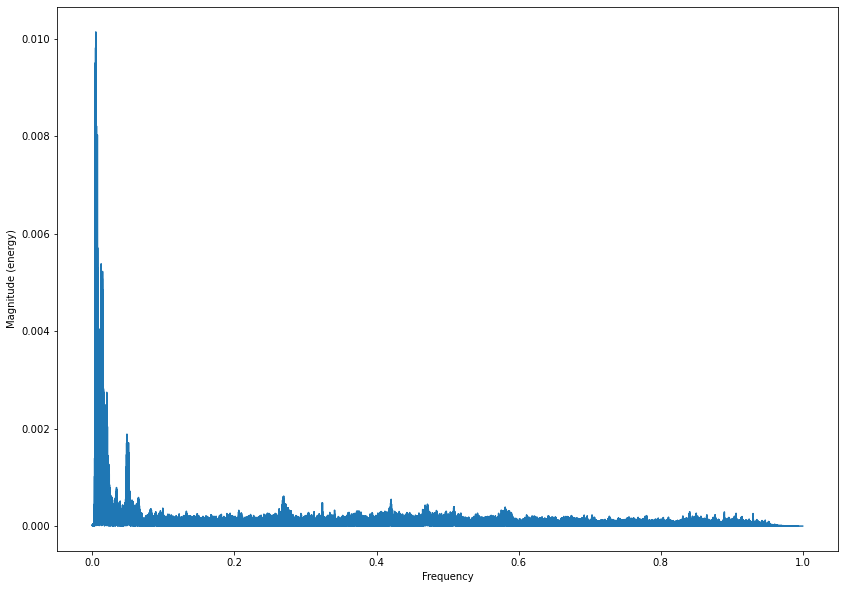

In [24]:
y_kick,sr_kick = librosa.load('audio_kick.wav')
y_snare,sr_snare = librosa.load('audio_snare.wav')

# print(sr_kick)
# print(sr_snare)
# print(y_kick.shape)
# print(y_snare.shape)

# yd, srd = librosa.load('drums.wav')
# tempo, beats = librosa.beat.beat_track(y=yd, sr=srd)
# print(tempo)
# print(beats)

yd, srd = librosa.load('drums.wav')
yd = yd.astype(np.float32) / srd 
yd = (0.9 / max(yd)) * yd

plt.figure(figsize=(14,10)) 
plt.magnitude_spectrum(yd)


<!-- END QUESTION -->

<!-- BEGIN QUESTION -->

**Question A6.5 (advanced):** 

Run beat tracking on the drum track (result from spleeter) and then use the resulting beat onsets combined with the extracted pitch from the vocal melody to transcribe the vocal melody to music notation using [music21](https://web.mit.edu/music21/). For each beat map the median MIDI pitch of the vocals to a tiny notation string. Listen to the generated MIDI melody using Music21. Can you still identify the melody?



 

**(2 points)**


<!-- END QUESTION -->

<!-- BEGIN QUESTION -->

#### **Question A6.G (CSC575/advanced):** 

This question only needs to be answered by graduate students who are registered in CSC575 and for these students it will be graded instead of question A6.1 which is optional for them. 

Use the feature extraction code from: [kadenze_mir_c2_s1_2_classification.ipynb](https://github.com/gtzan/mir_program_kadenze/blob/master/course2/session1/kadenze_mir_c2_s1_2_classification.ipynb) to compute track-level audio features for all the GTZAN dataset and 
train a linear support vector machine for classification with 5-fold cross-validation.  

Use the 2-stem model of Spleeter to separate vocals and accompaniment for all 1000 tracks of the GTZAN dataset. 
Now compute the classification results using the same audio features, classifier, and cross-validation for the following configurations: 

1. Original 
2. Vocals-only 
3. Accompanuiment-only 
4. Vocals audio features concatenated with accompaniment audio features 

Show the results in a table. 

The comparison with configuration 4 is somewhat unfair as the dimensionality of the feature vector is double the dimensionality of the other configruations. Using principal component analysis (PCA) from sklearn to 
reduce the dimensions of each of these configurations to 10. Repeat the classification experiment for the PCA-transformed configurations. 

Show the PCA-transformed results in a table and write a paragraph about what conclusions you can draw from this small experiment. 


<!-- END QUESTION -->



---

To double-check your work, the cell below will rerun all of the autograder tests.

In [ ]:
grader.check_all()

## Submission

Make sure you have run all cells in your notebook in order before running the cell below, so that all images/graphs appear in the output. The cell below will generate a zip file for you to submit. **Please save before exporting!**

In [ ]:
# Save your notebook first, then run this cell to export your submission.
grader.export()